### Imports

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
# Set the default seaborn style to 'darkgrid'
sns.set_theme(style="darkgrid")

# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

### Exploratory data analysis - part 1
Aðeins að skoða grunngögn og vinnslu á þeim og þannig stöff.

Virðist vera að við joinum á `HEINUM` til að sameina **kaupskra** og **stadfangaskra**, og svo er `FASTNUM` unique id fyrir hverja og eina fasteign.

Lýsingar á gögnunum: https://www.fasteignaskra.is/gogn/grunngogn-til-nidurhals/kaupskra-fasteigna/eigindalysing-kaupskrar & https://www.fasteignaskra.is/library/Samnyttar-skrar-/Fyrirtaeki-stofnanir/Nidurhal/Sta%C3%B0fangaskr%C3%A1%20eigindal%C3%BDsing.pdf

In [10]:
# Paths to the datasets
kaupskra_path = 'kaupskra.csv.zip'
stadfangaskra_path = 'stadfangaskra.csv.zip'

# Reading in kaupskra and stadfangaskra data
kaupskra = pd.read_csv(kaupskra_path, encoding='latin1', sep=';')
stadfangaskra = pd.read_csv(stadfangaskra_path, encoding='utf-8', sep=',')

# Lets join kaupskra and stadfangaskra together on HEINUM to form our final dataset
data = pd.merge(kaupskra, stadfangaskra, on='HEINUM') # inner join
data.shape

In [113]:
data.head()

,FAERSLUNUMER,EMNR,SKJALANUMER,FASTNUM,HEIMILISFANG,POSTNR_x,HEINUM,SVFN,SVEITARFELAG,UTGDAG,THINGLYSTDAGS,KAUPVERD,FASTEIGNAMAT,FASTEIGNAMAT_GILDANDI,BRUNABOTAMAT_GILDANDI,BYGGAR,FEPILOG,EINFLM,LOD_FLM,LOD_FLMEIN,FJHERB,TEGUND,FULLBUID,ONOTHAEFUR_SAMNINGUR,FID,HNITNUM,SVFNR,BYGGD,LANDNR,MATSNR,POSTNR_y,HEITI_NF,HEITI_TGF,HUSNR,BOKST,VIDSK,SERHEITI,DAGS_INN,DAGS_LEIDR,GAGNA_EIGN,TEGHNIT,YFIRFARID,YFIRF_HEITI,ATH,NAKV_XY,HNIT,N_HNIT_WGS84,E_HNIT_WGS84,NOTNR,LM_HEIMILISFANG,VEF_BIRTING,HUSMERKING
0,500342,411,R-005069/2006,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2006-05-08 00:00:00.0,2006-05-10 09:22:39.0,25500,19610,90600.0,53950.0,1963,010101,102.3,NaN,NaN,3.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
1,679963,441,D-006418/2021,2067730,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2021-10-21 00:00:00.0,2021-10-25 15:18:50.0,50000,62250,100400.0,67900.0,1963,010201,139.8,820.0,m²,2.0,Fjölbýli,1,0,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
2,680332,441,A-009807/2021,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2021-11-01 00:00:00.0,2021-11-04 15:14:48.0,44000,48850,90600.0,53950.0,1963,010101,102.3,820.0,m²,3.0,Fjölbýli,1,0,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
3,702045,441,B-005352/2023,2526176,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2023-06-27 00:00:00.0,2023-08-03 12:17:21.0,119900,10200,99350.0,67950.0,,010301,129.5,820.0,m²,2.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
4,705839,441,B-010279/2023,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2023-11-15 00:00:00.0,2023-11-25 14:57:33.0,86500,84300,90600.0,53950.0,2023,010101,107.2,820.0,m²,3.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3


In [144]:
print('Oldest record is from', data['THINGLYSTDAGS'].min())
print('Newest record is from', data['THINGLYSTDAGS'].max())

Oldest record is from 2006-05-08 08:19:48.0
Newest record is from 2024-03-20 15:32:57.0


In [146]:
data['THINGLYSTDAGS'] = pd.to_datetime(data['THINGLYSTDAGS']) # Converting to datetime

In [147]:
mun_count = data.groupby('SVEITARFELAG').size().reset_index(name='Count').sort_values(by='Count', ascending=False)
focus_municipalities = mun_count.head(16)['SVEITARFELAG'].tolist()


In [148]:
# Plot the sveitarfelag distribution
municipalities = data['SVEITARFELAG'].unique()
print('Total number of municipalities are', len(municipalities))

Total number of municipalities are 64


In [149]:
data = data.loc[data['SVEITARFELAG'].isin(focus_municipalities)]
data = data.loc[data['ONOTHAEFUR_SAMNINGUR'] == 0]

### Exploratory data analysis - part 2
Teikna upp gröf og þannig stuff.

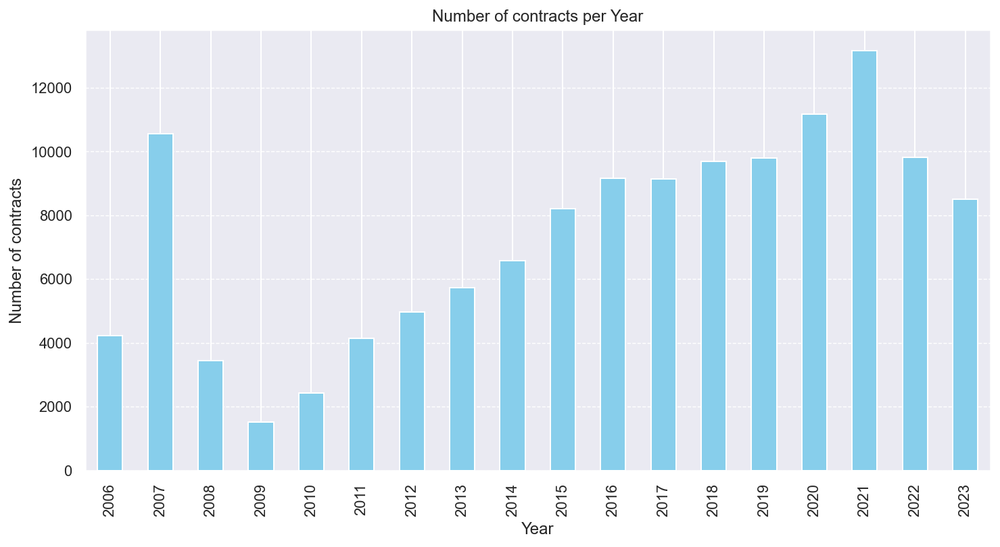

In [150]:
import pandas as pd
import matplotlib.pyplot as plt

# Extract the Year temporarily and count records, excluding 2024
yearly_counts = data['THINGLYSTDAGS'].dt.year[data['THINGLYSTDAGS'].dt.year != 2024].value_counts()

# Sort the years
yearly_counts = yearly_counts.sort_index()

# Plot the data
plt.figure(figsize=(12, 6))  # Set the figure size for better readability
yearly_counts.plot(kind='bar', color='skyblue')  # Create a bar chart
plt.title('Number of contracts per Year')
plt.xlabel('Year')
plt.ylabel('Number of contracts')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Add horizontal grid lines
plt.show()

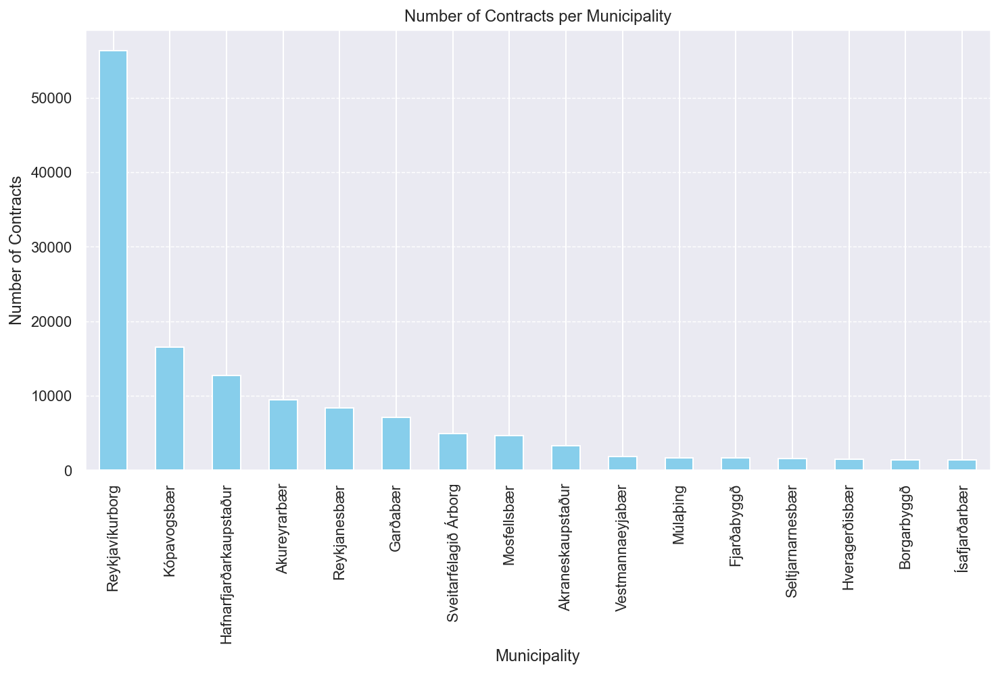

In [151]:
# Extract the municipalities data
municipalities_counts = data['SVEITARFELAG'].value_counts()

# The data is already sorted by count in descending order due to value_counts()

# Plot the data
plt.figure(figsize=(12, 6))  # Set the figure size for better readability
municipalities_counts.plot(kind='bar', color='skyblue')  # Create a bar chart
plt.title('Number of Contracts per Municipality')
plt.xlabel('Municipality')
plt.ylabel('Number of Contracts')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Add horizontal grid lines
plt.show()

In [20]:
import numpy as np
import pandas as pd
import folium


# Filter data between 2016-06-01 and 2016-07-31
map_data = data[(data['UTGDAG'] >= '2016-01-01') & (data['UTGDAG'] <= '2016-12-31')][['HEIMILISFANG', 'N_HNIT_WGS84', 'E_HNIT_WGS84']]

iceland_map = folium.Map(location=[64.9631, -19.0208], zoom_start=6, tiles='CartoDB Positron')

# Add smaller markers/dots for incidents
for index, row in map_data.iterrows():
    folium.CircleMarker(
        location=[row['N_HNIT_WGS84'], row['E_HNIT_WGS84']],
        radius=1,  # Adjust the radius as needed
        color='red',
        fill=True,
        fill_color='red',
        popup=row['HEIMILISFANG']
    ).add_to(iceland_map)

iceland_map


# Hér að neðan byrjar explainer notebook-ið, en hægt að nota dót að ofan

# Motivation
- What is your dataset?
- Why did you choose this/these particular dataset(s)?
- What was your goal for the end user's experience?

The main dataset that was used in this project is an open-source dataset containing property registration data for the Icelandic housing market, which was downloaded from this source: https://www.fasteignaskra.is/gogn/grunngogn-til-nidurhals. It contains information on historical purchase prices, property address, postal codes, square meters, etc. To obtain geological data a supplementary dataset was needed containing latitude and longitude values for each property, and by merging these two datasets together the final dataset was created and ending being 75.4 MB in size.

The idea was to explore the Icelandic Housing market – which is a niche market – but as the team members are from Iceland, we thought it would be a great idea as the housing market is always relevant and the ideas of our project can be used for other housing market data, hoping to give insights to potential buyers, as it is for most people the main investment of their life.

The goal was to create a compelling and insightful story of the Icelandic housing market by...

# Basic stats
Let's understand the dataset better:
- Write about your choices in data cleaning and preprocessing
- Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

To better understand the dataset, we utilized the set of tools acquired during the course. The sections **Data cleaning and preprocessing** and **Data stats** take you through it.

## Data cleaning and preprocessing

We started off with importing necessary packages and reading in the datasets and merging them into a single dataset and viewing the dataset.

In [6]:
import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
# Set the default seaborn style to 'darkgrid'
sns.set_theme(style="darkgrid")

# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

In [11]:
# Paths to the datasets
kaupskra_path = 'kaupskra.csv.zip'
stadfangaskra_path = 'stadfangaskra.csv.zip'

# Reading in kaupskra and stadfangaskra data
kaupskra = pd.read_csv(kaupskra_path, encoding='latin1', sep=';')
stadfangaskra = pd.read_csv(stadfangaskra_path, encoding='utf-8', sep=',')

# Lets join kaupskra and stadfangaskra together on HEINUM to form our final dataset
data = pd.merge(kaupskra, stadfangaskra, on='HEINUM') # inner join
data.shape

(193005, 52)

In [4]:
# Taking a quick look at the data we have
data.head()

,FAERSLUNUMER,EMNR,SKJALANUMER,FASTNUM,HEIMILISFANG,POSTNR_x,HEINUM,SVFN,SVEITARFELAG,UTGDAG,THINGLYSTDAGS,KAUPVERD,FASTEIGNAMAT,FASTEIGNAMAT_GILDANDI,BRUNABOTAMAT_GILDANDI,BYGGAR,FEPILOG,EINFLM,LOD_FLM,LOD_FLMEIN,FJHERB,TEGUND,FULLBUID,ONOTHAEFUR_SAMNINGUR,FID,HNITNUM,SVFNR,BYGGD,LANDNR,MATSNR,POSTNR_y,HEITI_NF,HEITI_TGF,HUSNR,BOKST,VIDSK,SERHEITI,DAGS_INN,DAGS_LEIDR,GAGNA_EIGN,TEGHNIT,YFIRFARID,YFIRF_HEITI,ATH,NAKV_XY,HNIT,N_HNIT_WGS84,E_HNIT_WGS84,NOTNR,LM_HEIMILISFANG,VEF_BIRTING,HUSMERKING
0,500342,411,R-005069/2006,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2006-05-08 00:00:00.0,2006-05-10 09:22:39.0,25500,19610,90600.0,53950.0,1963,010101,102.3,NaN,NaN,3.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
1,679963,441,D-006418/2021,2067730,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2021-10-21 00:00:00.0,2021-10-25 15:18:50.0,50000,62250,100400.0,67900.0,1963,010201,139.8,820.0,m²,2.0,Fjölbýli,1,0,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
2,680332,441,A-009807/2021,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2021-11-01 00:00:00.0,2021-11-04 15:14:48.0,44000,48850,90600.0,53950.0,1963,010101,102.3,820.0,m²,3.0,Fjölbýli,1,0,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
3,702045,441,B-005352/2023,2526176,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2023-06-27 00:00:00.0,2023-08-03 12:17:21.0,119900,10200,99350.0,67950.0,,010301,129.5,820.0,m²,2.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3
4,705839,441,B-010279/2023,2067729,Melabraut 3,170,1024617,1100,Seltjarnarnesbær,2023-11-15 00:00:00.0,2023-11-25 14:57:33.0,86500,84300,90600.0,53950.0,2023,010101,107.2,820.0,m²,3.0,Fjölbýli,1,1,Stadfangaskra.fid-24f8547a_18ebb06342d_-3298,10032272,1100,1,117368,NaN,170,Melabraut,Melabraut,3.0,NaN,NaN,NaN,2007-09-07,2009-02-23,HMS,0.0,0.0,NaN,NaN,NaN,POINT (354080 408959),64.152289,-21.999498,956.0,Melabraut 3 (117368),Melabraut 3 (117368),3


The dataset contains 193.005 records of property registration with 52 columns of different data, some more relevant and useful than other. By taking a look at descriptions of these different columns we were able to identify the most important features. Here are links to the descriptions, but they are in Icelandic so google translate comes in handy: https://www.fasteignaskra.is/gogn/grunngogn-til-nidurhals/kaupskra-fasteigna/eigindalysing-kaupskrar & https://www.fasteignaskra.is/library/Samnyttar-skrar-/Fyrirtaeki-stofnanir/Nidurhal/Sta%C3%B0fangaskr%C3%A1%20eigindal%C3%BDsing.pdf.

The final set of columns/features we chose are these:
- `FASTNUM`: Property identification number
- `HEIMILISFANG`: Address
- `POSTNR_x`: Postal code
- `SVEITARFELAG`: Municipal
- `UTGDAG`: Date of signing the purchase agreement
- `THINGLYSTDAGS`: Date of registration of purchase agreement
- `KAUPVERD`: Purchase price of property
- `FASTEIGNAMAT`: Property assessment at the time of the purchase agreement
- `FASTEIGNAMAT_GILDANDI`: Current property assessment
- `BRUNABOTAMAT_GILDANDI`: Current fire compensation assessment
- `BYGGAR`: Year of construction
- `EINFLM`: Unit area of property
- `FJHERB`: Number of rooms
- `TEGUND`: Property type
- `ONOTHAEFUR_SAMNINGUR`: If contract is unusable then 1 otherwise 0
- `N_HNIT_WGS84`: North coordinates in WGS84 latitude
- `E_HNIT_WGS84`: East coordinates in WGS84 longitude

In [14]:
## Data cleaning and pre-processing ##

# List of features we want to work with
features = ['FASTNUM','HEIMILISFANG','POSTNR_x','SVEITARFELAG','UTGDAG','THINGLYSTDAGS','KAUPVERD','FASTEIGNAMAT'
           ,'FASTEIGNAMAT_GILDANDI','BRUNABOTAMAT_GILDANDI','BYGGAR','EINFLM','FJHERB','TEGUND'
           ,'ONOTHAEFUR_SAMNINGUR','N_HNIT_WGS84','E_HNIT_WGS84']

# Filtering on those columns
data = data[features]

We then did the common convertion of setting the date columns to be in datetime as well as stripping whitespace from all string columns.

In [ ]:
# Converting date columns to datetime
data['UTGDAG'] = pd.to_datetime(data['UTGDAG'])
data['THINGLYSTDAGS'] = pd.to_datetime(data['THINGLYSTDAGS'])

# Selecting string columns and applying str.strip() to get rid off white space
string_columns = data.select_dtypes(include=[object])
for column in string_columns:
    data[column] = data[column].str.strip()

To work with relevant property data we decided to filter on `ONOTHAEFUR_SAMNINGUR` = 0 since we only wanted useable records.

In [16]:
data = data.loc[data['ONOTHAEFUR_SAMNINGUR'] == 0] # Filter out unuseable records

In [18]:
data.head()

,FASTNUM,HEIMILISFANG,POSTNR_x,SVEITARFELAG,UTGDAG,THINGLYSTDAGS,KAUPVERD,FASTEIGNAMAT,FASTEIGNAMAT_GILDANDI,BRUNABOTAMAT_GILDANDI,BYGGAR,EINFLM,FJHERB,TEGUND,ONOTHAEFUR_SAMNINGUR,N_HNIT_WGS84,E_HNIT_WGS84
1,2067730,Melabraut 3,170,Seltjarnarnesbær,2021-10-21,2021-10-25 15:18:50,50000,62250,100400.0,67900.0,1963,139.8,2.0,Fjölbýli,0,64.152289,-21.999498
2,2067729,Melabraut 3,170,Seltjarnarnesbær,2021-11-01,2021-11-04 15:14:48,44000,48850,90600.0,53950.0,1963,102.3,3.0,Fjölbýli,0,64.152289,-21.999498
9,2017735,Hjallavegur 28,104,Reykjavíkurborg,2008-02-06,2008-02-07 13:22:27,14000,13220,41800.0,24100.0,1949,55.0,1.0,Fjölbýli,0,64.144457,-21.860799
10,2017736,Hjallavegur 28,104,Reykjavíkurborg,2008-02-06,2008-02-07 13:24:57,81001,36790,99600.0,79800.0,1949,203.6,4.0,Fjölbýli,0,64.144457,-21.860799
11,2017735,Hjallavegur 28,104,Reykjavíkurborg,2018-12-12,2019-01-12 10:50:49,35900,27150,41800.0,24100.0,1949,55.0,1.0,Fjölbýli,0,64.144457,-21.860799


Above is the cleaned and processed dataset that we analyzed further in the coming sections.

## Data stats
In our exploratory data analysis we wanted to understand in more detail the distribution of the dataset for different timeperiods and different municpalities.

We started by looking at the time horizon of our historical property contracts and how many municipalites are in Iceland discovering that the data is from May 2006 to March 2024, containing data for 64 different municipalities.

In [37]:
print('Oldest contract is from', data['THINGLYSTDAGS'].min().strftime('%Y-%m-%d'))
print('Newest contract is from', data['THINGLYSTDAGS'].max().strftime('%Y-%m-%d'))

mun = data['SVEITARFELAG'].unique()
print(f'\nThere are {len(mun)} municipalities in Iceland')

Oldest contract is from 2006-05-09
Newest contract is from 2024-03-20

There are 64 municipalities in Iceland


Then we plotted a bar chart showing how many historical property contracts have been made in each municipality.

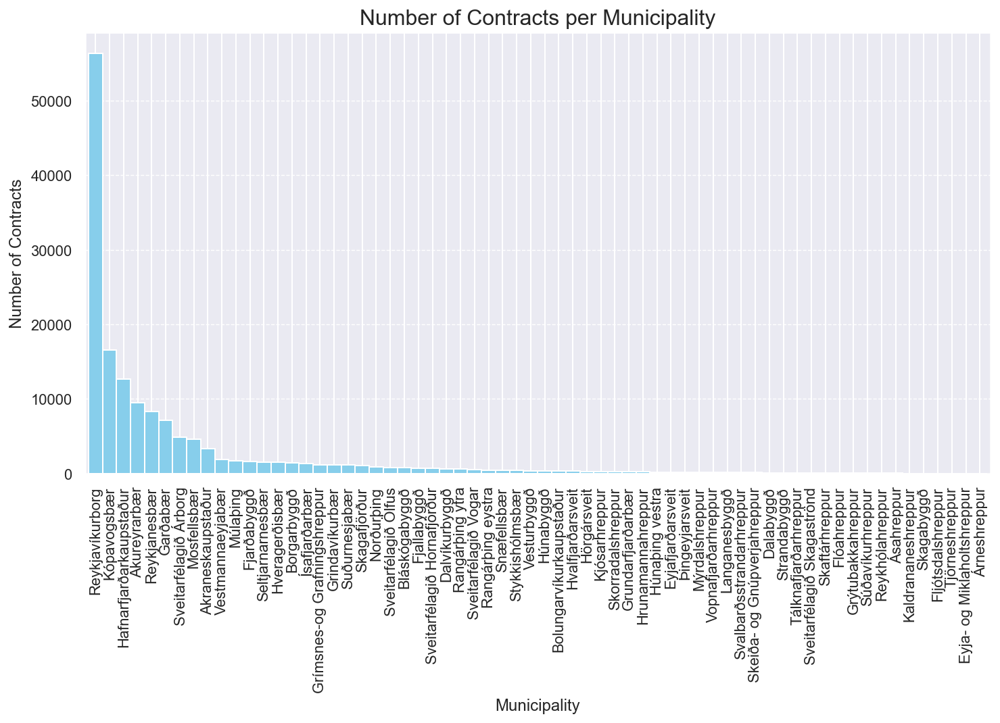

In [22]:
# Extract the municipalities data
municipalities_counts = data['SVEITARFELAG'].value_counts()

# The data is already sorted by count in descending order due to value_counts()

# Plot the data
plt.figure(figsize=(12, 6))  # Set the figure size for better readability
# Create a bar chart with thicker bars (default width is 0.8, so try 1 for thicker bars)
municipalities_counts.plot(kind='bar', color='skyblue', width=1)
plt.title('Number of Contracts per Municipality', fontsize=16)  # Bigger title font size
plt.xlabel('Municipality')
plt.ylabel('Number of Contracts')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', linewidth=0.7)  # Add horizontal grid lines
plt.show()


No surprise that **Reykjavíkurborg**, the capital of Iceland, has the far greatest number of contracts, and smaller towns in the countryside have very few historical contracts. By looking at the graph, and applying domain knowledge as experts in being from Iceland, we chose our "focus" municipalites to be the top 16 with regards to number of contracts. Most of them are from the capital region but we also have big towns in Eastern and Northern parts of Iceland.

In [38]:
focus_municipalities = mun_count.head(16)['SVEITARFELAG'].tolist()
data = data.loc[data['SVEITARFELAG'].isin(focus_municipalities)]

# Data Analysis
- Describe your data analysis and explain what you've learned about the dataset.
- If relevant, talk about your machine-learning.


# Genre
Which genre of data story did you use?
- Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?
- Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?


# Visualizations
- Explain the visualizations you've chosen.
- Why are they right for the story you want to tell?


# Discussion
Think critically about your creation
What went well?,
What is still missing? What could be improved?, Why?

# Contributions
Who did what?
- You should write (just briefly) which group member was the main responsible for which elements of the assignment. (I want you guys to understand every part of the assignment, but usually there is someone who took lead role on certain portions of the work. That's what you should explain).
- It is not OK simply to write "All group members contributed equally".